# Audio Feature Engineering

In [18]:
import os
import sys
import shutil

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
np.random.seed(42)

from scipy.io import wavfile
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa
import wave


import IPython
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
import plotly.tools as tls


from tqdm import tqdm_notebook
import IPython.display as ipd  # To play sound in the notebook

import warnings
warnings.filterwarnings('ignore')

# %matplotlib inline
matplotlib.style.use('ggplot')

### Audio features extracted
 * [MFCC](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum)
 * [Spectral Centroid](https://en.wikipedia.org/wiki/Spectral_centroid)
 * [Chroma](http://labrosa.ee.columbia.edu/matlab/chroma-ansyn/)
 * [Spectral Contrast](http://ieeexplore.ieee.org/document/1035731/)

In [2]:
sys.path.append("../src/main/python/")

In [3]:
from shabda.helpers import audio

In [4]:
TRAIN_DATA_PATH = "../data/freesound-audio-tagging/input/"
SAMPLE_RATE = 44100
hihat = TRAIN_DATA_PATH + '/audio_train/' + '00044347.wav'   # Hi-hat
fingersnap = TRAIN_DATA_PATH + '/audio_train/' + '06feb8ea.wav'   # Hi-hat

In [40]:
ipd.Audio(fingersnap)

In [41]:
ipd.Audio(hihat)

In [84]:
def get_duration_wav(wav_filename):
    f = wave.open(wav_filename, 'r')
    frames = f.getnframes()
    rate = f.getframerate()
    duration = frames / float(rate)
    f.close()
    return duration

def audio_norm(data):
    """
    Normalizes the input np.array
    :param data: np.array
    :return:
    """
    max_data = np.max(data)
    min_data = np.min(data)
    data = (data - min_data) / (max_data - min_data + 1e-6)
    return data - 0.5

In [32]:
get_duration_wav(fingersnap)

7.2

<a id="intro_mfcc"></a>
## <center> Introduction to MFCC

Before the Deep Learning era, people developed techniques to extract features from audio signals. It turns out that these techniques are still useful. One such technique is computing the MFCC (Mel Frquency Cepstral Coefficients) from the raw audio. Before we jump to MFCC, let's talk about extracting features from the sound.

If we just want to classify some sound, we should build features that are **speaker independent**. Any feature that only gives information about the speaker (like the pitch of their voice) will not be helpful for classification. In other words, we should extract features that depend on the "content" of the audio rather than the nature of the speaker. Also, a good feature extraction technique should mimic the human speech perception. We don't hear loudness on a linear scale. If we want to double the perceived loudness of a sound, we have to put 8 times as much energy into it. Instead of a linear scale, our perception system uses a log scale. 

Taking these things into account, Davis and Mermelstein came up with MFCC in the 1980's. MFCC mimics the logarithmic perception of loudness and pitch of human auditory system and tries to eliminate speaker dependent characteristics by excluding the fundamental frequency and their harmonics. The underlying mathematics is quite complicated and we will skip that. For those interested, here is the [detailed explanation](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/).

![](https://openi.nlm.nih.gov/imgs/512/219/3859042/PMC3859042_sensors-13-12929f1.png)

<a id="librosa_mfcc"></a>
#### Generating MFCC using Librosa
The library librosa has a function to calculate MFCC. Let's compute the MFCC of an audio file and visualize it.

In [42]:
def simple_mfcc(fname):
    wav, _ = librosa.core.load(fname, sr=SAMPLE_RATE)
    wav = wav[:2*44100]

    mfcc = librosa.feature.mfcc(wav, sr = SAMPLE_RATE, n_mfcc=40)
    print("MFCC Shape: " , mfcc.shape)

    plt.imshow(mfcc, cmap='hot', interpolation='nearest');

MFCC Shape:  (40, 173)


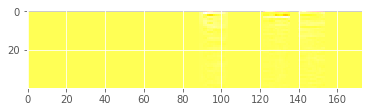

In [43]:
simple_mfcc(fingersnap)

In [ ]:
simple_mfcc(hihat)

In [181]:
def custom_mfcc(fname):
    sampling_rate = 44100
    audio_duration = 2
    max_audio_length = sampling_rate * audio_duration
    n_mfcc = 64
    data, sample_rate = audio.load_wav_audio_file(file_path=fname)

    data = audio.pad_data_array(data=data,
                                max_audio_length=max_audio_length)

    #TODO Commented this code
    data = audio.get_frequency_spectrum(data=data, n_mfcc=n_mfcc,
                                        sampling_rate=sampling_rate)

    print("MFCC Shape: " , data.shape)

    plt.imshow(data, cmap='hot', interpolation='nearest');

MFCC Shape:  (64, 256)


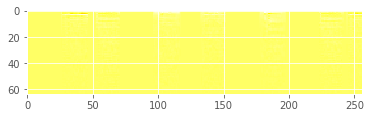

In [182]:
custom_mfcc(fingersnap)

MFCC Shape:  (64, 256)


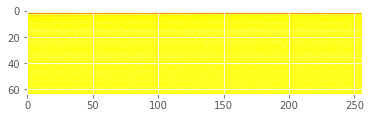

In [183]:
custom_mfcc(hihat)

### Spectral Center

In [184]:
def get_spectral_centre(fname):
    y, sr = librosa.load(fname)
    data = librosa.feature.spectral_centroid(y=y, sr=sr, hop_length=512)
    print("spectral_center Shape: " , data.shape)
    data = audio_norm(data)
    fig, ax = plt.subplots(3, 1, figsize = (12, 12))
    
    duration = np.arange(len(y))/float(sr)
    ax[0].plot(duration, y)
    ax[1].imshow(data, cmap='hot', interpolation='nearest', extent=[0,data.shape[1],0,1], aspect='auto');
    ax[2].plot(data[0])
    return ipd.Audio(fname)

spectral_center Shape:  (1, 311)


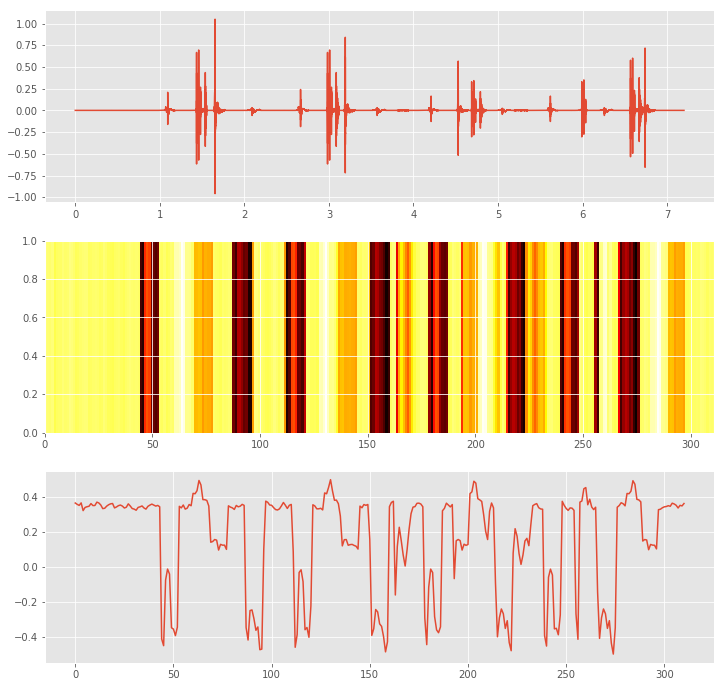

In [185]:
get_spectral_centre(fingersnap)

spectral_center Shape:  (1, 603)


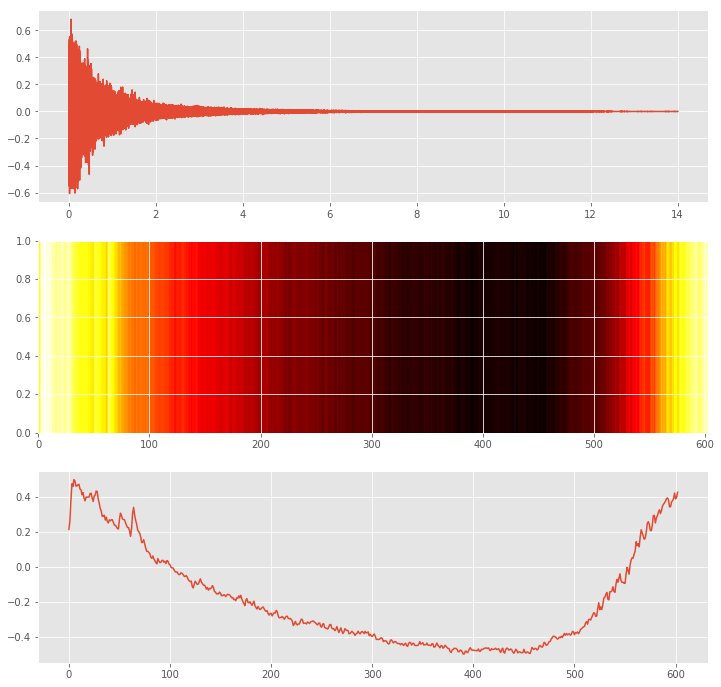

In [186]:
get_spectral_centre(hihat)

### Chroma

In [187]:
def get_chroma_stft(fname):
    y, sr = librosa.load(fname)
    data = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=512)
    print("spectral_center Shape: " , data.shape)
    data = audio_norm(data)
    fig, ax = plt.subplots(3, 1, figsize = (12, 12))
    
    duration = np.arange(len(y))/float(sr)
    ax[0].plot(duration, y)
    ax[1].imshow(data, cmap='hot', interpolation='nearest', extent=[0,data.shape[1],0,1], aspect='auto');
    ax[2].plot(data[0])
    return ipd.Audio(fname)

spectral_center Shape:  (12, 311)


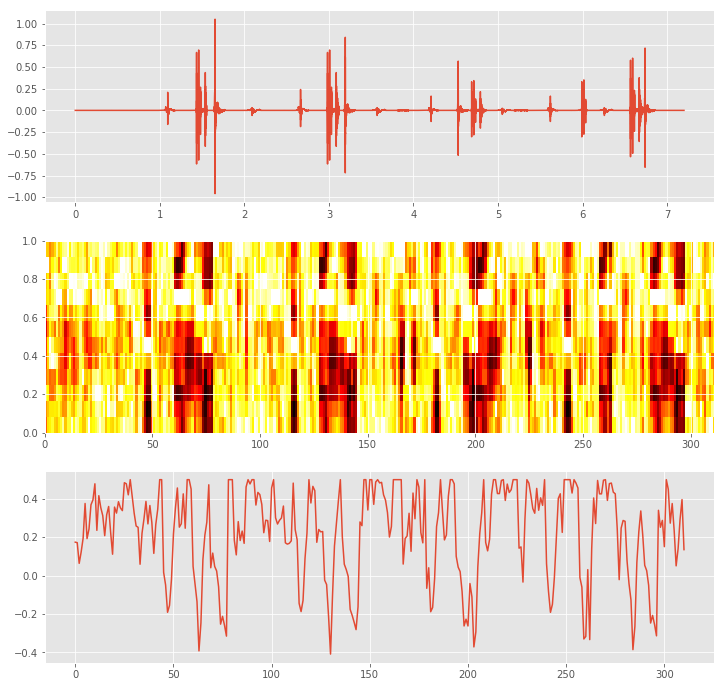

In [188]:
get_chroma_stft(fingersnap)

spectral_center Shape:  (12, 603)


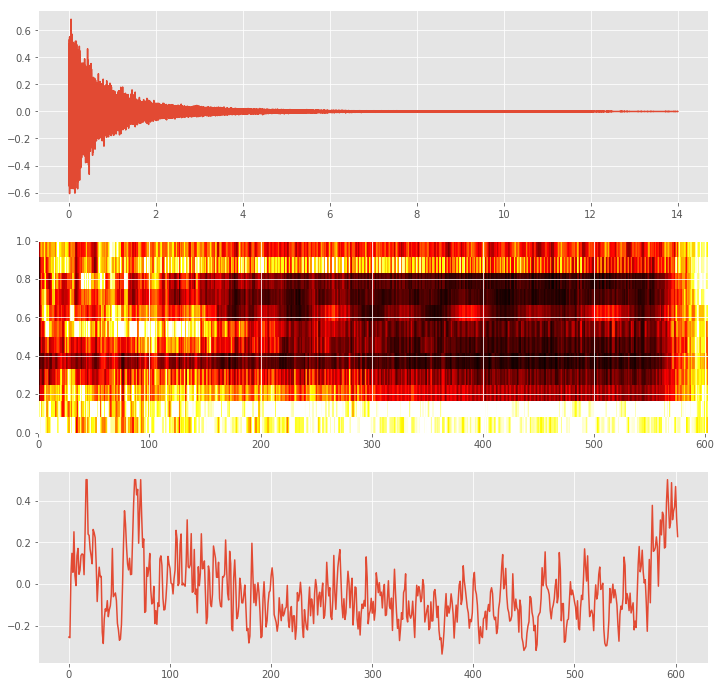

In [189]:
get_chroma_stft(hihat)

In [190]:
def get_spectral_contrast(fname):
    y, sr = librosa.load(fname)
    data = librosa.feature.spectral_contrast(y=y, sr=sr, hop_length=512)
    print("spectral_center Shape: " , data.shape)
    data = audio_norm(data)
    fig, ax = plt.subplots(3, 1, figsize = (12, 12))
    
    duration = np.arange(len(y))/float(sr)
    ax[0].plot(duration, y)
    ax[1].imshow(data, cmap='hot', interpolation='nearest', extent=[0,data.shape[1],0,1], aspect='auto');
    ax[2].plot(data[0])
    return ipd.Audio(fname)

spectral_center Shape:  (7, 311)


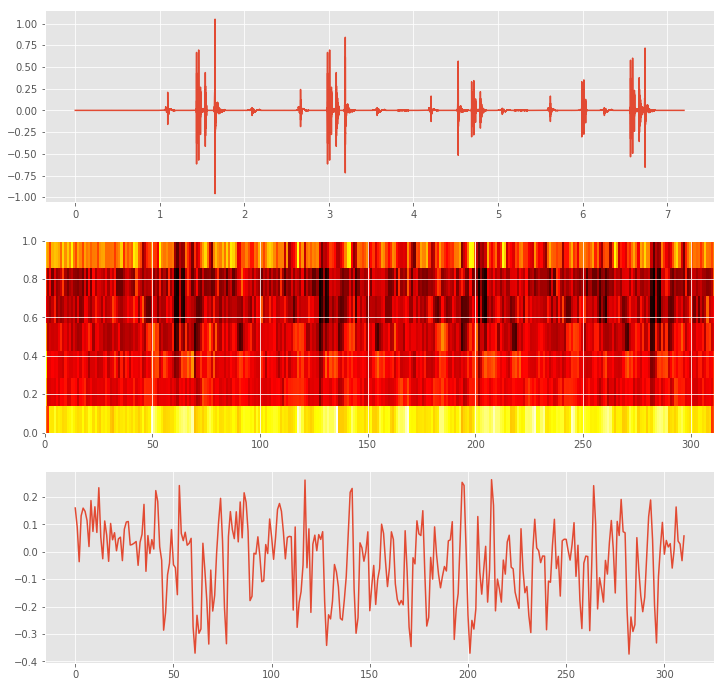

In [191]:
get_spectral_contrast(fingersnap)

spectral_center Shape:  (7, 603)


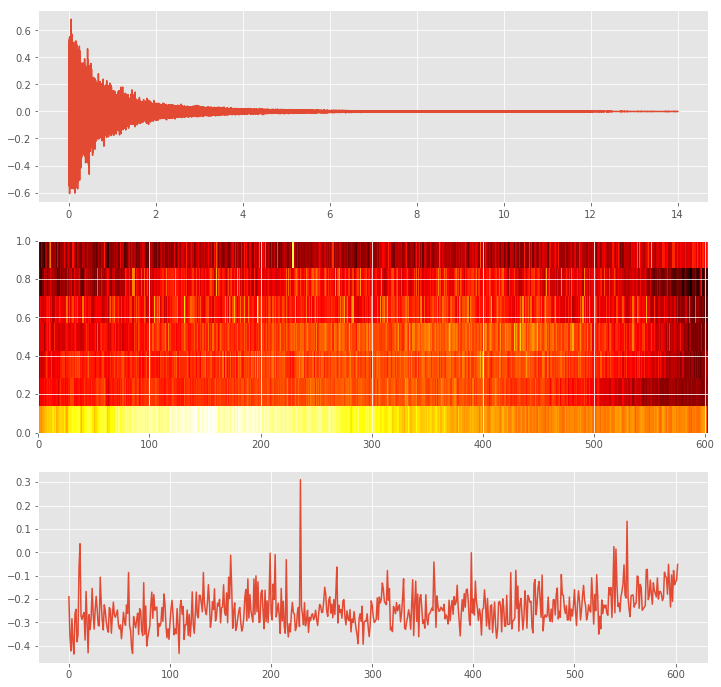

In [192]:
get_spectral_contrast(hihat)

### Combined Features

In [203]:
#References: https://github.com/ruohoruotsi/LSTM-Music-Genre-Classification
def extract_audio_features(list_of_audiofiles, hop_length):
    #timeseries_length = min(self.timeseries_length_list)
    timeseries_length = 128
    data = np.zeros((len(list_of_audiofiles), timeseries_length, 33), dtype=np.float64)
    target = []

    for i, file in enumerate(list_of_audiofiles):
        y, sr = librosa.load(file)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, hop_length=hop_length, n_mfcc=13)
        print(mfcc.T.shape)
        spectral_center = librosa.feature.spectral_centroid(y=y, sr=sr, hop_length=hop_length)
        print(spectral_center.T.shape)
        chroma = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)
        print(chroma.T.shape)
        spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr, hop_length=hop_length)
        print(spectral_contrast.T.shape)

        data[i, :, 0:13] = mfcc.T[0:timeseries_length, :]
        data[i, :, 13:14] = spectral_center.T[0:timeseries_length, :]
        data[i, :, 14:26] = chroma.T[0:timeseries_length, :]
        data[i, :, 26:33] = spectral_contrast.T[0:timeseries_length, :]

        print("Extracted features audio track %i of %i." % (i + 1, len(list_of_audiofiles)))

    return data#, np.expand_dims(np.asarray(target), axis=1)

In [204]:
data = extract_audio_features([fingersnap, hihat], 512)

(311, 13)
(311, 1)
(311, 12)
(311, 7)
Extracted features audio track 1 of 2.
(603, 13)
(603, 1)
(603, 12)
(603, 7)
Extracted features audio track 2 of 2.


In [200]:
data.shape

(2, 128, 33)

### FFT

In [175]:
def naive_fft(fname):
    rate, data = wavfile.read(fname)
    fft_out = fft(data)
    fig, ax = plt.subplots(2,1, figsize=(8,8))
    ax[0].plot(data, fft_out, ".")
    ax[1].plot(range(len(data)), fft_out, ".")
    plt.show()

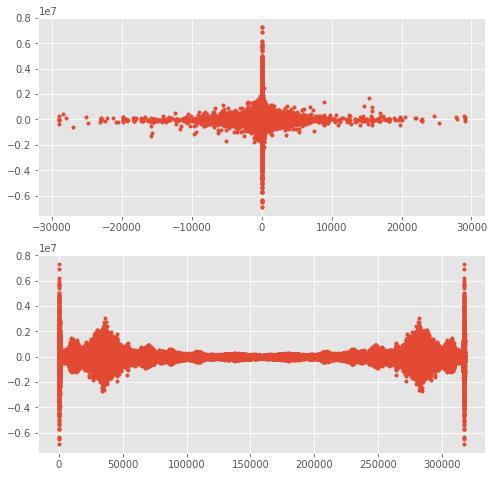

In [176]:
naive_fft(fingersnap)

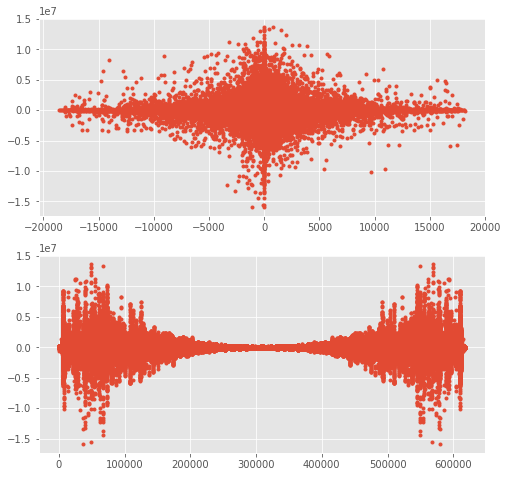

In [177]:
naive_fft(hihat)

In [178]:
def fft_real_part(fname):
    rate, data = wavfile.read(fname)
    fft_out = fft(data)
    fig, ax = plt.subplots(2,1, figsize=(8,8))
    ax[0].plot(data, np.abs(fft_out), ".")
    ax[1].plot(range(len(data)), np.abs(fft_out), ".")

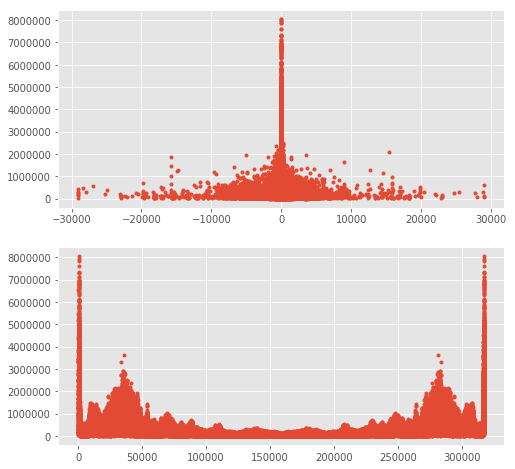

In [179]:
fft_real_part(fingersnap)

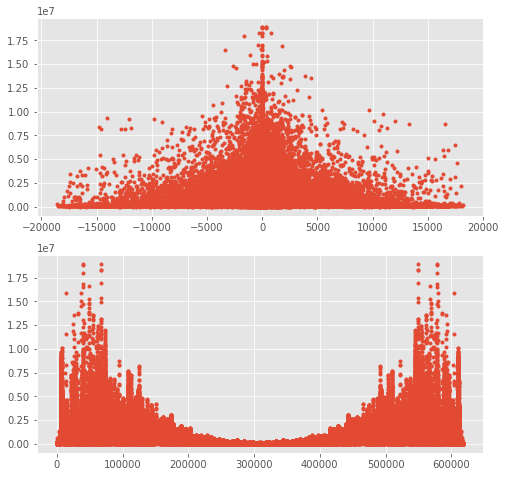

In [180]:
fft_real_part(hihat)

### Live FFT from your machine Mic

In [10]:
#!/usr/bin/env python
# encoding: utf-8

## Module infomation ###
# Python (3.4.4)
# numpy (1.10.2)
# PyAudio (0.2.9)
# matplotlib (1.5.1)
# All 32bit edition
########################

import numpy as np
import pyaudio

import matplotlib.pyplot as plt

class SpectrumAnalyzer:
    FORMAT = pyaudio.paFloat32
    CHANNELS = 1
    RATE = 16000
    CHUNK = 512
    START = 0
    N = 512

    wave_x = 0
    wave_y = 0
    spec_x = 0
    spec_y = 0
    data = []

    def __init__(self):
        self.pa = pyaudio.PyAudio()
        self.stream = self.pa.open(format = self.FORMAT,
            channels = self.CHANNELS, 
            rate = self.RATE, 
            input = True,
            output = False,
            frames_per_buffer = self.CHUNK)
        # Main loop
        self.loop()

    def loop(self):
        try:
            while True :
                self.data = self.audioinput()
                self.fft()
                self.graphplot()

        except KeyboardInterrupt:
            self.pa.close()

        print("End...")

    def audioinput(self):
        ret = self.stream.read(self.CHUNK)
        ret = np.fromstring(ret, np.float32)
        return ret

    def fft(self):
        self.wave_x = range(self.START, self.START + self.N)
        self.wave_y = self.data[self.START:self.START + self.N]
        self.spec_x = np.fft.fftfreq(self.N, d = 1.0 / self.RATE)  
        y = np.fft.fft(self.data[self.START:self.START + self.N])    
        self.spec_y = [np.sqrt(c.real ** 2 + c.imag ** 2) for c in y]

    def graphplot(self):
        plt.clf()
        # wave
        plt.subplot(311)
        plt.plot(self.wave_x, self.wave_y)
        plt.axis([self.START, self.START + self.N, -0.5, 0.5])
        plt.xlabel("time [sample]")
        plt.ylabel("amplitude")
        #Spectrum
        plt.subplot(312)
        plt.plot(self.spec_x, self.spec_y, marker= 'o', linestyle='-')
        plt.axis([0, self.RATE / 2, 0, 50])
        plt.xlabel("frequency [Hz]")
        plt.ylabel("amplitude spectrum")
        #Pause
        plt.pause(.01)
    

In [12]:
%matplotlib
#use stop button to stop mannualy!
try:
    SpectrumAnalyzer()
except:
    print("got stopped externally!")

Using matplotlib backend: TkAgg


/home/mageswarand/anaconda3/envs/tensorflow1.0/lib/python3.6/site-packages/ipykernel_launcher.py:56: DeprecationWarning:

The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead



got stopped externally!


In [13]:
%matplotlib inline

#TODO https://github.com/dariocazzani/TensorFlow-audio-processing